In [ ]:
# Johan Trippitelli - StudentID: 260917958
# Christopher Chong, StudentID: 260976714
# Minh Anh Trinh, StudentID: 260853143


import numpy as np
#%matplotlib notebook
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.core.debugger import set_trace
import warnings

warnings.filterwarnings('ignore')


#!pip install transformers[tf,torch,sentencepiece,vision,optuna,sklearn,onnxruntime]==4.16.2
!pip install matplotlib
!pip install ipywidgets
!pip install bertviz==1.2.0

In [ ]:
# importing and loading the data
!pip install -q transformers
!pip install -q datasets

from datasets import load_dataset
emotions = load_dataset("emotion")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 520.4/520.4 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.2 MB/s eta 0:00:00


Extracting data files:   0%|          | 0/3 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/16000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/2000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [ ]:
#Pre-processing data
from sklearn.feature_extraction.text import CountVectorizer

#Extract the training data and test data
emotions_train = emotions['train']
emotions_test = emotions['test']

#Split training and test data into input and labels
emotions_train_input = emotions_train['text']
emotions_train_label = emotions_train['label']
emotions_test_input = emotions_test['text']
emotions_test_label = emotions_test['label']

#Tokenization
vectorizer = CountVectorizer()
# tokenize and build vocab
X_train = vectorizer.fit_transform(emotions_train_input)
X_test = vectorizer.transform(emotions_test_input)
y_train = emotions_train_label
y_test = emotions_test_label

In [ ]:
# Naive Bayes class with runtime and entropy loss function
import numpy as np
import time

class NaiveBayes:
    def __init__(self, alpha=1):
        self.alpha = alpha
        self.pi = None
        self.theta = None
        self.loss = None
        self.log_posterior = None

    def prior(self, y_train):
        unique_classes, counts = np.unique(y_train, return_counts=True)
        prior_probabilities = counts / counts.sum()
        prior_dict = dict(zip(unique_classes, prior_probabilities))
        self.pi = prior_dict

    def thetas(self, X_train, y_train):
        X_train_dense = X_train.toarray()
        unique_classes, counts = np.unique(y_train, return_counts=True)
        n_classes = unique_classes.shape[0]
        n_features = X_train_dense.shape[1]
        word_counts_per_class = np.zeros((n_classes, n_features), dtype=int)

        for class_index in unique_classes:
            word_counts_per_class[class_index, :] = np.sum(X_train[y_train == class_index, :], axis=0)

        total_word_counts_per_class = np.sum(word_counts_per_class, axis=1)

        self.theta = (word_counts_per_class + self.alpha) / (total_word_counts_per_class[:, np.newaxis] + self.alpha * word_counts_per_class.shape[1])

    def fit(self, X_train, y_train):
        start_time = time.time()
        self.prior(y_train)
        self.thetas(X_train, y_train)
        end_time = time.time()  # Record the end time
        runtime = end_time - start_time
        print(f"Runtime: {runtime} seconds")

    def predict(self, X_test):
        X_dense = X_test.toarray()
        log_pi = np.log(np.array(list(self.pi.values())))
        log_theta = np.log(self.theta)
        self.log_posterior = X_dense @ log_theta.T + log_pi
        return np.argmax(self.log_posterior, axis=1)

    def accuracy(self, y_pred, y_test):
        return np.mean(y_pred == y_test)

    def calculate_loss(self, y_test):
        # Cross-entropy loss calculation
        class_probabilities = np.exp(self.log_posterior - np.max(self.log_posterior, axis=1)[:, np.newaxis])
        class_probabilities /= np.sum(class_probabilities, axis=1)[:, np.newaxis]
        loss = -np.sum(np.log(class_probabilities[np.arange(len(y_test)), y_test])) / len(y_test)

        self.loss = loss
        print(f"Test Loss: {loss}")


In [ ]:
# Utilizing Naive Bayes
model = NaiveBayes()
pi = model.prior(y_train)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model.calculate_loss(y_test)
model.accuracy(y_pred, y_test)

Runtime: 1.0507028102874756 seconds
Test Loss: 0.98533336499602


0.7655

In [ ]:
#Naive Bayes Class (Using multinomial distribution)
class NaiveBayes:
  def __init__(self, alpha=1):
    self.alpha = alpha
    self.pi = None
    self.theta = None

  def prior(self, y_train):
    # Calculate the priors for each class given the frequency of occurrence in the training data
    unique_classes, counts = np.unique(y_train, return_counts=True)

    # Turn into probabilities
    prior_probabilities = counts / counts.sum()

    # Storing the priors in a dictionary for easy access
    prior_dict = dict(zip(unique_classes, prior_probabilities))

    self.pi = prior_dict

  def thetas(self, X_train, y_train):
    # Convert training features to an array
    X_train_dense = X_train.toarray()

    # Map class labels to indices
    unique_classes, counts = np.unique(y_train, return_counts=True)
    n_classes = unique_classes.shape[0]

    # Initialize an array to store word counts for each class
    n_features = X_train_dense.shape[1]
    word_counts_per_class = np.zeros((n_classes, n_features), dtype=int)

    # Accumulate word counts for each class
    for class_index in unique_classes:
      word_counts_per_class[class_index, :] = np.sum(X_train[y_train == class_index, :], axis=0)

    # Calculate the total word count for each class
    total_word_counts_per_class = np.sum(word_counts_per_class, axis=1)

    self.theta = (word_counts_per_class + self.alpha) / (total_word_counts_per_class[:, np.newaxis] + self.alpha * word_counts_per_class.shape[1])

  def fit(self, X_train, y_train):
    self.prior(y_train)
    self.thetas(X_train, y_train)

  def predict(self, X_test):
    # Ensure X is in the same format as the training data
    X_dense = X_test.toarray()

    # Calculate log probabilities for numerical stability
    log_pi = np.log(np.array(list(self.pi.values())))
    log_theta = np.log(self.theta)

    # Calculate posterior probabilities for each class
    log_posterior = X_dense @ log_theta.T + log_pi
    return np.argmax(log_posterior, axis=1)

  def accuracy(self, y_pred, y_test):
    return np.mean(y_pred == y_test)

In [ ]:
# Utilizing Naive Bayes
model = NaiveBayes()
pi = model.prior(y_train)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
nb_accuracy = model.accuracy(y_pred, y_test)
nb_accuracy

0.7655

In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
!pip install tqdm boto3 requests regex sentencepiece sacremoses


In [ ]:
# Preprocessing the data for BERT

tokenizer = torch.hub.load('huggingface/pytorch-transformers', 'tokenizer', 'bert-base-uncased')    # Download vocabulary from S3 and cache.

def tokenize(batch):
  return tokenizer(batch["text"], padding=True, truncation=True)

Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main


In [ ]:
model = torch.hub.load('huggingface/pytorch-transformers', 'model', 'bert-base-uncased')    # Download model and configuration from S3 and cache.

emotions_encoded = emotions.map(tokenize, batched=True, batch_size=None)



Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main


Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [ ]:
# sets model to run on the uncased bert base model which is pretrained and has it set to work on the 6 labels

# odwnloads the pretrained model so we can fine tune it

from transformers import AutoModelForSequenceClassification
num_labels = 6
pretrained_model = (AutoModelForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=num_labels).to(device))
trained_model = (AutoModelForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=num_labels).to(device))
trained_model_frozen  = (AutoModelForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=num_labels).to(device))

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
emotions_encoded["train"].features
emotions_encoded.set_format("torch", columns=["input_ids", "attention_mask", "label"])


emotions_encoded["train"].features

{'text': Value(dtype='string', id=None),
 'label': ClassLabel(names=['sadness', 'joy', 'love', 'anger', 'fear', 'surprise'], id=None),
 'input_ids': Sequence(feature=Value(dtype='int32', id=None), length=-1, id=None),
 'token_type_ids': Sequence(feature=Value(dtype='int8', id=None), length=-1, id=None),
 'attention_mask': Sequence(feature=Value(dtype='int8', id=None), length=-1, id=None)}

In [ ]:
emotions_encoded["train"].features

{'text': Value(dtype='string', id=None),
 'label': ClassLabel(names=['sadness', 'joy', 'love', 'anger', 'fear', 'surprise'], id=None),
 'input_ids': Sequence(feature=Value(dtype='int32', id=None), length=-1, id=None),
 'token_type_ids': Sequence(feature=Value(dtype='int8', id=None), length=-1, id=None),
 'attention_mask': Sequence(feature=Value(dtype='int8', id=None), length=-1, id=None)}

In [ ]:
!pip install accelerate -U

In [ ]:
from transformers import Trainer, TrainingArguments
#!pip install transformers[torch]
batch_size = 32





# had to go to runtime and entirely restart the runtime so this would work
training_args = TrainingArguments(output_dir="results",
                                  num_train_epochs=4,
                                  learning_rate=1e-4,
                                  per_device_train_batch_size=batch_size,
                                  per_device_eval_batch_size=batch_size,
                                  load_best_model_at_end=True,
                                  metric_for_best_model="acc",
                                  weight_decay=0.01,
                                  evaluation_strategy="no",
                                  save_strategy="no",
                                  disable_tqdm=False)


In [ ]:
######################################################


def accuracy_score (y_pred, y_true):
        accuracy = np.sum(y_pred == y_true) / len(y_true)
        return accuracy

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc}

In [ ]:
# uses transformers trainer to fine-tune the pretrained model after we've tried testing it

# uses trainer object with the model, training arguments, training and test datasets, and the evalutaion function

from transformers import Trainer
#os.environ['WANDB_DISABLED'] = 'true'

pretrained_trainer = Trainer(model=pretrained_model,
                  args=training_args,
                  train_dataset=emotions_encoded["train"],
                  eval_dataset=emotions_encoded["validation"],
                  compute_metrics=compute_metrics,
                  tokenizer=tokenizer)

pretrained_prediction = pretrained_trainer.predict(emotions_encoded["validation"])



You're using a BertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


In [ ]:
pretrained_prediction.metrics

{'test_loss': 1.7922419309616089,
 'test_accuracy': 0.1635,
 'test_runtime': 8.6311,
 'test_samples_per_second': 231.721,
 'test_steps_per_second': 7.299}

In [ ]:


trained_trainer = Trainer(model=trained_model,
                  args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=emotions_encoded["train"],
                  eval_dataset=emotions_encoded["validation"],
                  tokenizer=tokenizer)

trained_trainer.train()



trained_prediction = trained_trainer.predict(emotions_encoded["validation"])



Step,Training Loss
500,0.425900
1000,0.145500
1500,0.097900
2000,0.071100


In [ ]:
trained_prediction.metrics

{'test_loss': 0.1626163125038147,
 'test_accuracy': 0.9375,
 'test_runtime': 8.688,
 'test_samples_per_second': 230.203,
 'test_steps_per_second': 7.251}

In [ ]:
pretrained_trainer.evaluate()

{'eval_loss': 1.7922419309616089,
 'eval_accuracy': 0.1635,
 'eval_runtime': 8.6531,
 'eval_samples_per_second': 231.132,
 'eval_steps_per_second': 7.281}

In [ ]:
trained_trainer.evaluate()

{'eval_loss': 0.1626163125038147,
 'eval_accuracy': 0.9375,
 'eval_runtime': 8.7207,
 'eval_samples_per_second': 229.34,
 'eval_steps_per_second': 7.224,
 'epoch': 4.0}

In [ ]:
for param in trained_model_frozen.base_model.parameters():
    param.requires_grad = False
# keeps the weights of the pre-trained encoder frozen, optimizing only the weights of the head layers, sets the encoder parameter "require_grad" to false

trained_trainer_frozen = Trainer(model=trained_model_frozen, args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=emotions_encoded["train"],
                  eval_dataset=emotions_encoded["validation"],
                  tokenizer=tokenizer)

trained_trainer_frozen.train()



trained_prediction_frozen = trained_trainer_frozen.predict(emotions_encoded["validation"])


Step,Training Loss
500,1.578100
1000,1.549000
1500,1.540000
2000,1.533600


In [ ]:
trained_prediction_frozen.metrics

{'test_loss': 1.5329034328460693,
 'test_accuracy': 0.426,
 'test_runtime': 8.7256,
 'test_samples_per_second': 229.21,
 'test_steps_per_second': 7.22}

In [ ]:
review_text = "I love completing my todos! Best app ever!!!"
encoded_review = tokenizer.encode_plus(
  review_text,
  max_length=160,
  add_special_tokens=True,
  return_token_type_ids=False,
  pad_to_max_length=True,
  return_attention_mask=True,
  return_tensors='pt',
)





input_ids = encoded_review['input_ids'].to(device)
attention_mask = encoded_review['attention_mask'].to(device)
output = model(input_ids, attention_mask)

print(output)
_, prediction = torch.max(output, dim=1)


print(f'Review text: {review_text}')
print(f'Sentiment  : {class_names[prediction]}')





In [ ]:
# This code visualizes the attention mechanism of  the bert model when processing 2 sentences from the dataset


from bertviz import head_view
from transformers import AutoModel
from transformers import AutoTokenizer

model_ckpt = "bert-base-uncased"

model = AutoModelForSequenceClassification.from_pretrained(model_ckpt, output_attentions=True, num_labels=6)
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)

sentence_a = "i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake" # sentence a has an answer of label 0
sentence_b = "i am feeling grouchy" # sentence b has an answer of label 3

viz_inputs = tokenizer(sentence_a, sentence_b, return_tensors='pt').to("cpu")




from transformers import pipeline



non_trained_classifier = pipeline( task="text-classification",model=model, tokenizer=tokenizer)
wrong_prob_for_all_labels = non_trained_classifier(sentence_a, return_all_scores=True)

wrong_answer_label =  non_trained_classifier(sentence_a)

print(wrong_prob_for_all_labels)
print(wrong_answer_label) # this will give correct label 3 for sentence b


trained_classifier = pipeline( task="text-classification",model=trained_model.to("cpu"), tokenizer=tokenizer)



correct_prob_for_all_labels = trained_classifier(sentence_b, return_all_scores=True)

correct_answer_label =  trained_classifier(sentence_b)

print(correct_prob_for_all_labels)
print(correct_answer_label) # this will give correct label 3 for sentence b



# BUT THE ANSWER FOR SENTENCE A IS LABEL #0

attention = (model(**viz_inputs).attentions)
sentence_b_start = (viz_inputs.token_type_ids == 0).sum(dim=1)
tokens = tokenizer.convert_ids_to_tokens(viz_inputs.input_ids[0])

head_view(attention, tokens, sentence_b_start, heads=[8])

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[[{'label': 'LABEL_0', 'score': 0.1383591741323471}, {'label': 'LABEL_1', 'score': 0.18560630083084106}, {'label': 'LABEL_2', 'score': 0.16894422471523285}, {'label': 'LABEL_3', 'score': 0.1703162044286728}, {'label': 'LABEL_4', 'score': 0.20039169490337372}, {'label': 'LABEL_5', 'score': 0.13638244569301605}]]
[{'label': 'LABEL_4', 'score': 0.20039169490337372}]
[[{'label': 'LABEL_0', 'score': 0.00011873721814481542}, {'label': 'LABEL_1', 'score': 4.946447734255344e-05}, {'label': 'LABEL_2', 'score': 7.274442032212391e-05}, {'label': 'LABEL_3', 'score': 0.9995741248130798}, {'label': 'LABEL_4', 'score': 9.212038276018575e-05}, {'label': 'LABEL_5', 'score': 9.287139982916415e-05}]]
[{'label': 'LABEL_3', 'score': 0.9995741248130798}]


<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# HARD CODED ACCURACY VALUES FOR THE MODELS
nb_accuracy = 0.7655
bert_accuracy = 0.1635
trained_bert_accuracy = 0.9375
frozen_bert_accuracy = 0.426

def compare_models(nb_accuracy, bert_accuracy, trained_bert_accuracy, frozen_bert_accuracy):
    models_accuracy = {'Naive Bayes': nb_accuracy, 'Untrained BERT': bert_accuracy,
                       'Trained BERT': trained_bert_accuracy, 'Frozen BERT':  frozen_bert_accuracy}

    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(models_accuracy.keys()), y=list(models_accuracy.values()), palette="viridis")
    for index, value in enumerate(models_accuracy.values()):
        plt.text(index, value + 0.01, f'{value:.2f}', ha='center', va='bottom')
    plt.title("Model Accuracy Comparison")
    plt.ylabel("Accuracy")
    plt.show()

    winner = max(models_accuracy, key=models_accuracy.get)
    print("\nWinner:", winner)

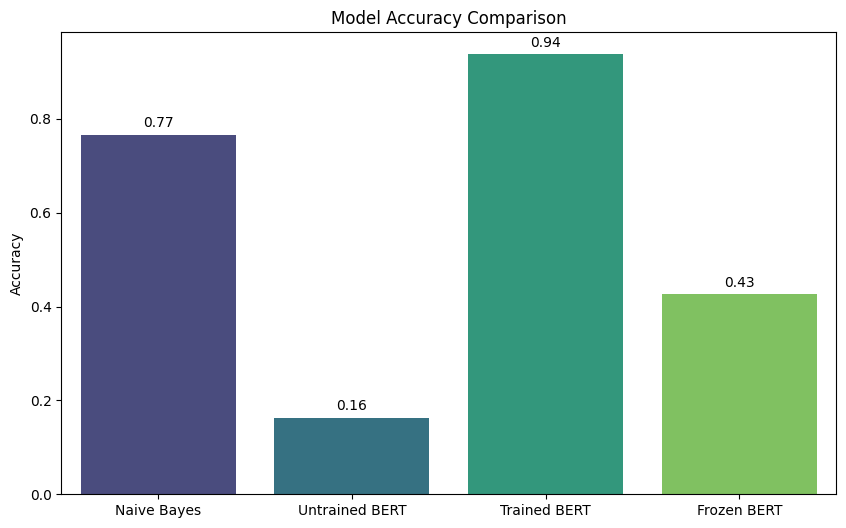


Winner: Trained BERT


In [ ]:
compare_models(nb_accuracy, bert_accuracy, trained_bert_accuracy, frozen_bert_accuracy)
